# End-to-end multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.15.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test iamge.

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some information about the data :
* we are dealing with images ( unstructured data ) so its probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs ( this means there are 120 different classes ).
* There are around 10,000+ images in the training set ( these images have labels ).
* There are around 10,000+ images in the test set ( these images have no labels, because we'll want to predict them ).




In [ ]:
# unzip the uploaded data into google drive
#!unzip "drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog vision/"

Get our workspace ready


* import TensorFlow
* import TensorFlow Hub
* make sure we are using a GPU









In [79]:
# Import necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF version:", hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU")else "not available")

TF version: 2.15.0
TF version: 0.15.0
GPU available


## Getting our data ready ( turning into tensors )
with all machine learning models, our data has to be in numerical format. so we will be turning our images into tensors (numerical representation).

lets start by accessing our data and checking out the labels

In [80]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [81]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [82]:
# How many images are there of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

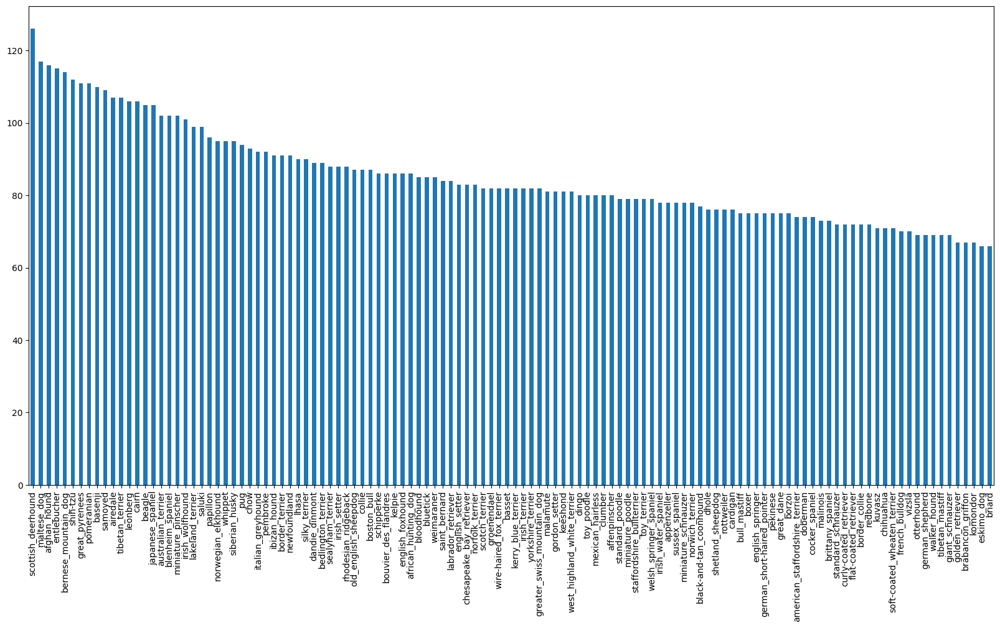

In [83]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [84]:
# what is the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

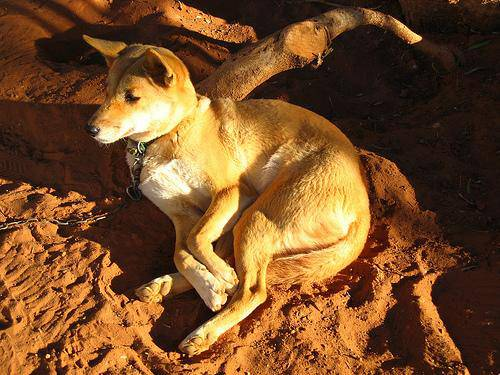

In [85]:
# lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

lets get a list of all our image file pathnames

In [86]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [87]:
# create pathnames from image ID's
filenames= ["drive/MyDrive/Dog vision/train/"+fname +".jpg" for fname in labels_csv["id"]]

# check the first 10
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [88]:
import os
os.listdir("drive/MyDrive/Dog vision/train")

['e4067d97184c1acb63af99e1e30945fe.jpg',
 'e0af99a3fd26fa2f9c601d782c5e7b6c.jpg',
 'dc99929daa2c14970c44afaf16ff502f.jpg',
 'e36c116cdff32db5d5b87b3c789ce46c.jpg',
 'dc17313b78b555caab983c9270dd3ab9.jpg',
 'e86503273b282ab18bd09c6b6ef63de7.jpg',
 'dee8384897c606a6301be26f1af90d67.jpg',
 'e3b0ae3127ce33aecce9f512db0051e1.jpg',
 'e35eb70a03e9f7f190a45a820295a671.jpg',
 'dc19a7f22b2f78763083633f21db6602.jpg',
 'e4bb015a94aec342233058e7bf430704.jpg',
 'e1efa8c07decd2fe9c807cbfe157b8bf.jpg',
 'dee5db7f0834ca1db80615a9d5fb6334.jpg',
 'e8baa7663b726cad8eefb319ca7d8195.jpg',
 'e1af6b48fbc089b3704ee26ade7b4f6c.jpg',
 'e1e156d500e30cf73f53970a09af93c9.jpg',
 'e23950a981b81588f00133a2c0c5cfb7.jpg',
 'e00130d97b9b4073e79e0aed53fedc3c.jpg',
 'e1e8cefa88b84062d11722537ec61214.jpg',
 'dde1f99c744c9c5f3bd471bd390314d6.jpg',
 'e3aa1999ea72d13102a3810d312b49ba.jpg',
 'dcb46e9b28b12225c4897b86bea16dbe.jpg',
 'e33ebba7c3621778acdd362e12d35660.jpg',
 'e5831fcb399c887cb0ac1e3a3d229f7b.jpg',
 'e4f4ecefab54cb

In [89]:
# check whether number of filenames matches number of actual image files

if len(os.listdir("drive/MyDrive/Dog vision/train"))==len(filenames):
  print("filenames match actual amount. proceed")
else:
  print("filenames do not match the actual amount of files. check the target directory")

filenames match actual amount. proceed


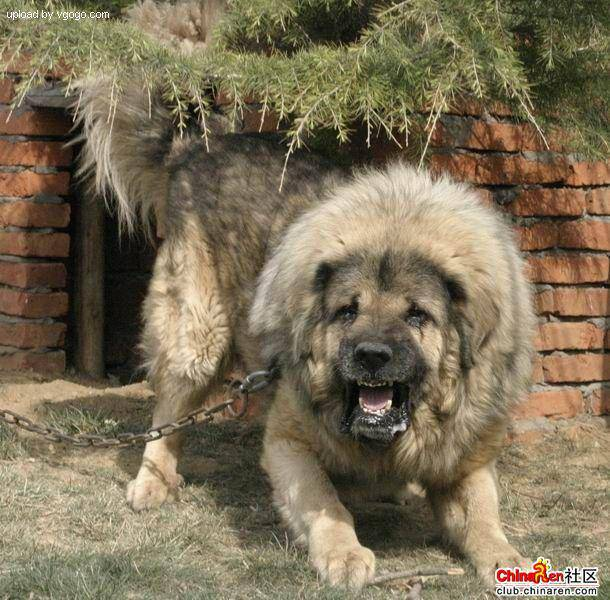

In [90]:
# one more check
Image(filenames[9000])

In [91]:
labels_csv["breed"][9000]

'tibetan_mastiff'

since we have now got our training image filepaths in a list, lets prepare our labels.



In [92]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels) # does the same as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [93]:
len(labels)

10222

In [94]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("number of labels matches number of filenames")
else:
  print("number of labels does not match the number of filenames, check data directories.")

number of labels matches number of filenames


In [95]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [96]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [97]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [98]:
len(boolean_labels)

10222

In [99]:
# example : turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [100]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [101]:
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
since the dataset from kaggle does'nt come with a validation set, we will create our own validation set

In [102]:
# setup X and y variables
X = filenames
y = boolean_labels

we are going to start off experimenting with ~1000 images and increase as needed.

In [103]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [104]:
# lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [105]:
# lets have a gaze at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images ( turning images into tensors )

To preprocess our images into tensors, we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable, 'image'.
3. Turn our 'image'(a jpg) into tensors
4. Normalize our image ( convert colour channel values from 0-255 to 0-1 )
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'

Before we do, lets see what importing an image looks like

In [106]:
# convert an image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [107]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [108]:
image.max(),image.min()

(255, 0)

In [109]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [110]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen what an image looks like as a tensor, lets make a function to preprocess them.

1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable, 'image'.
3. Turn our 'image'(a jpg) into tensors
4. Normalize our image ( convert colour channel values from 0-255 to 0-1 )
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'

In [111]:
# define image size
IMG_SIZE = 224

# create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a tensor.

  """
  # read in an image file
  image = tf.io.read_file(image_path)

  # turn the jpeg image into numerical tensor with 3 colour channels ( Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)

  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value ( 224, 224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## turning our data into batches

why turn our data into batches?

lets say you are trying to process 10,000+ images in one go, they all might not fit into memory.

so that is why we do about 32 (this is the batch size) images at a time ( you can manually adjust the batch size if need be).

In order to use tensorflow effectivelt, we need our data in the form of tensor tuple which look like this:
(image,label)

In [112]:
# create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  takes an image file path name and the associated label, processes the image and returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image,label

In [113]:
# demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

now we have got a way to turn our data into tuples of tensors in the form: (image,label), lets make a function to turn all of our data ('X','y') into batches.

In [114]:
# define the batch size, 32 is a good option
BATCH_SIZE=32

# create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data but does not shuffle if it is validation data.
  Also accepts test data as input ( no labels )
  """
  # if the data is a test dataset, we probably don't have labels.
  if test_data:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating training data batches...")
    # turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # create (image,label) tuples ( this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [115]:
# creating training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


creating training data batches...
creating validation data batches...


In [116]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

Our data is now in batches, however these can be a little hard to understand, so lets visualize them.



In [117]:
import matplotlib.pyplot as plt
# create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  displays a plot of 25 images and their labels from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10,10))

  # loop through 25 ( for displaying 25 images)
  for i in range(25):

    # creae subplots(5 rows,5 columns)
    ax = plt.subplot(5,5,i+1)

    # display an image
    plt.imshow(image[i])

    # add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])

    # turn the grif lines off
    plt.axis("off")

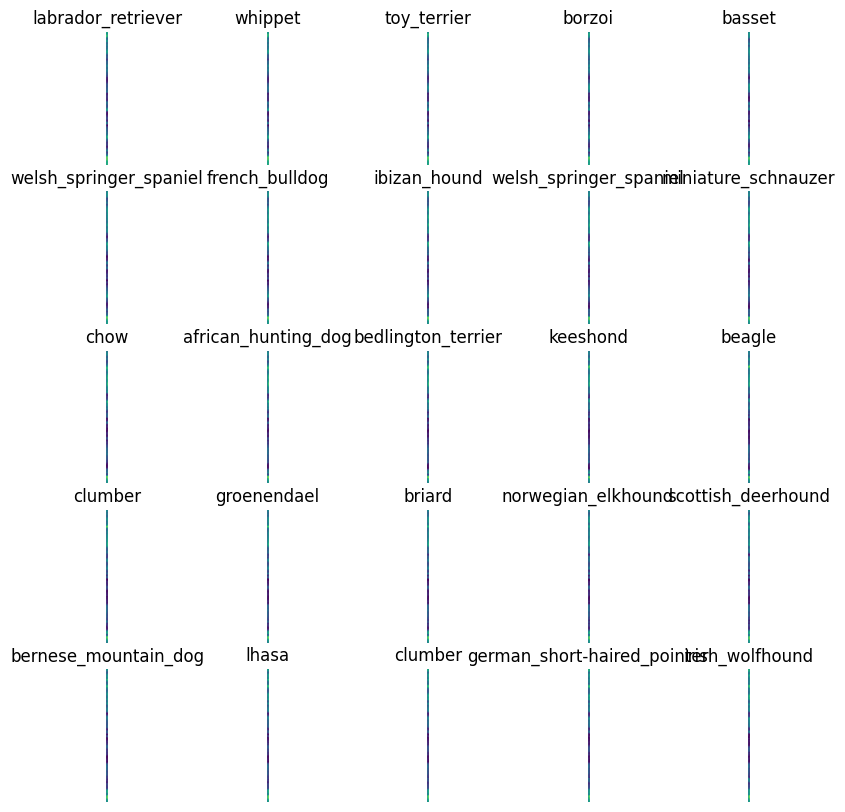

In [118]:
# now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

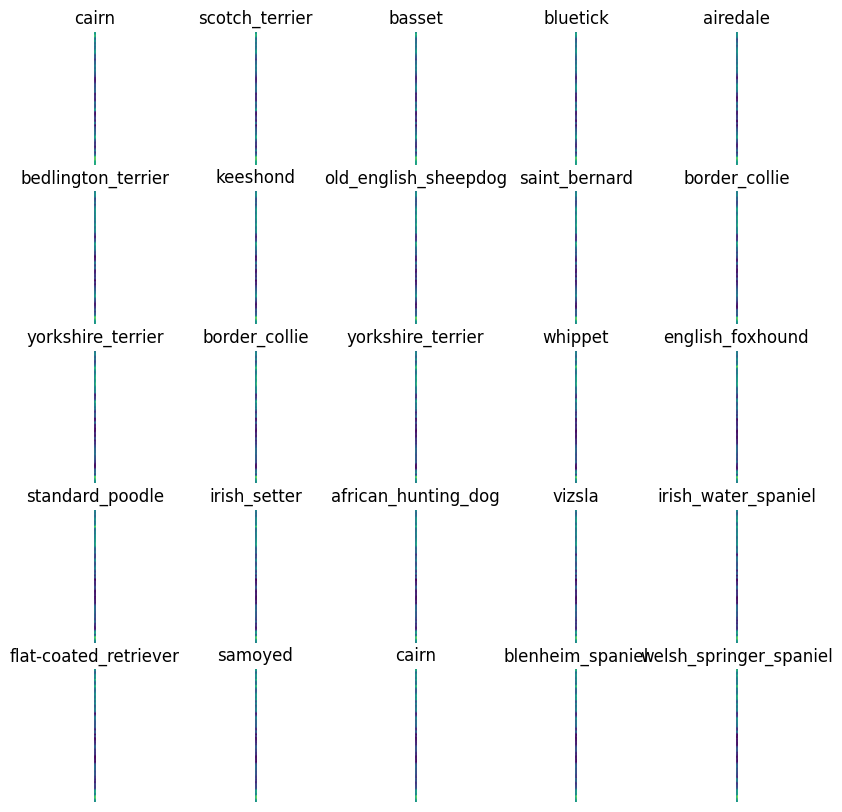

In [119]:
# now lets visualize our validation set
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape( our images shape, in the form of tensors ) to our model.
* The output shape(image labels, in the form of tensors) of our model.
* The URL of the model we want to use(from tensorflow hub/kaggle)

In [120]:
# Setup input shape of the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] #batch, height, width, color channels

# Setup outshape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we have got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which :
* Takes the input shape, output shape and the model we have chosen as a parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the models (tells the model the input shape it will be getting).
* Returns the model

All of these steps can be found here :
https://www.tensorflow.org/guide/keras

In [121]:
# create a function which buils a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation ="softmax") # layer 2 (output layer)

  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model



In [122]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early is a model stops improvivng.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a tensorboard callback we need to do three things:
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualize our models training logs with the %tensorboard magic function(we'll do this after model training).

In [123]:
# Load tensorboard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [124]:
%reload_ext tensorboard

In [125]:
import datetime

# create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing tensorflow logs
  logdir = os.path.join("drive/MyDrive/Dog vision/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfittin by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [126]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [127]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [128]:
# check to make sure we are still running on a GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


let's create a function which trains a model.

* create a model using 'create_model()'
* setup a tensorboard callback using 'create_tensorboard_callback()'
* call the 'fit()' function on our model passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks we would like to use.
* Return the model

In [129]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a model
  model = create_model()

  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # return the fitted model
  return model


In [130]:
# fit the model to the data
model=train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 120s 3s/step - loss: 4.6868 - accuracy: 0.0887 - val_loss: 3.5085 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 5s 192ms/step - loss: 1.6810 - accuracy: 0.6675 - val_loss: 2.2533 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 4s 144ms/step - loss: 0.5840 - accuracy: 0.9337 - val_loss: 1.7598 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 4s 149ms/step - loss: 0.2493 - accuracy: 0.9875 - val_loss: 1.5871 - val_accuracy: 0.5700
Epoch 5/100
25/25 [==============================] - 5s 208ms/step - loss: 0.1470 - accuracy: 0.9975 - val_loss: 1.5016 - val_accuracy: 0.5750
Epoch 6/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1003 - accuracy: 0.9987 - val_loss: 1.4386 - val_accuracy: 0.6150
Epoch 7

### checking the tensorboard logs

The tensorboard magic function ('%tensorboard') will access the logs direcotory we created earlier and visualize its content.


In [131]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [132]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 18s 106ms/step


array([[2.37330096e-03, 5.14136082e-05, 5.22087619e-04, ...,
        3.61617625e-04, 3.60148551e-05, 9.65561427e-04],
       [5.68301301e-04, 1.16760631e-04, 3.53131257e-03, ...,
        1.41810611e-04, 2.00671353e-03, 1.41435066e-05],
       [1.68819006e-05, 2.72017023e-05, 1.62085007e-06, ...,
        2.02078791e-05, 8.82286622e-06, 6.34763128e-05],
       ...,
       [2.28215868e-06, 6.56741258e-06, 4.44616308e-06, ...,
        2.94629967e-06, 1.25254883e-04, 1.45125305e-05],
       [1.79889856e-03, 3.03972920e-04, 4.62114331e-05, ...,
        3.86339307e-05, 3.83328079e-05, 1.38225080e-02],
       [1.91345171e-04, 1.68634033e-05, 1.31014778e-04, ...,
        2.75539793e-03, 2.15224107e-03, 9.51100592e-05]], dtype=float32)

In [133]:
predictions[0]

array([2.37330096e-03, 5.14136082e-05, 5.22087619e-04, 1.07815809e-04,
       4.91902872e-04, 1.21530029e-05, 1.13768885e-02, 1.74035842e-04,
       1.58229712e-04, 2.89322506e-03, 2.85548769e-04, 1.17847288e-04,
       5.49614670e-05, 1.13222552e-04, 9.56016709e-04, 2.59710621e-04,
       7.85778975e-05, 1.46396562e-01, 9.99310359e-05, 1.11426802e-04,
       1.97372050e-03, 3.16851714e-04, 2.18364912e-05, 8.13530234e-04,
       2.37517543e-05, 8.50296754e-04, 1.09576039e-01, 1.49391213e-04,
       8.06205382e-04, 1.39534939e-04, 5.75489394e-05, 1.06867414e-03,
       4.32864035e-04, 1.78155406e-05, 6.12138319e-05, 6.18292764e-02,
       9.20235198e-06, 3.66197404e-04, 2.12087798e-05, 1.09094712e-04,
       6.32977404e-04, 2.70263063e-05, 1.46139340e-04, 5.72417594e-05,
       3.63218351e-05, 2.62911111e-04, 7.70700426e-05, 9.08418806e-05,
       6.87375214e-05, 1.05356768e-04, 1.46044447e-04, 1.01502155e-05,
       9.05447465e-04, 9.80009572e-05, 4.77391477e-05, 7.80530754e-05,
      

In [135]:
len(predictions[0])

120

In [136]:
sum(predictions[0])

0.9999999812980604

In [137]:
predictions.shape

(200, 120)

In [138]:
len(y_val)

200

In [139]:
len(unique_breeds)

120

In [140]:
# first prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[2.37330096e-03 5.14136082e-05 5.22087619e-04 1.07815809e-04
 4.91902872e-04 1.21530029e-05 1.13768885e-02 1.74035842e-04
 1.58229712e-04 2.89322506e-03 2.85548769e-04 1.17847288e-04
 5.49614670e-05 1.13222552e-04 9.56016709e-04 2.59710621e-04
 7.85778975e-05 1.46396562e-01 9.99310359e-05 1.11426802e-04
 1.97372050e-03 3.16851714e-04 2.18364912e-05 8.13530234e-04
 2.37517543e-05 8.50296754e-04 1.09576039e-01 1.49391213e-04
 8.06205382e-04 1.39534939e-04 5.75489394e-05 1.06867414e-03
 4.32864035e-04 1.78155406e-05 6.12138319e-05 6.18292764e-02
 9.20235198e-06 3.66197404e-04 2.12087798e-05 1.09094712e-04
 6.32977404e-04 2.70263063e-05 1.46139340e-04 5.72417594e-05
 3.63218351e-05 2.62911111e-04 7.70700426e-05 9.08418806e-05
 6.87375214e-05 1.05356768e-04 1.46044447e-04 1.01502155e-05
 9.05447465e-04 9.80009572e-05 4.77391477e-05 7.80530754e-05
 5.39336907e-05 1.62831473e-03 1.30273678e-04 1.29679039e-01
 7.41621552e-05 5.50275217e-06 2.74375780e-04 8.23043010e-05
 3.50621849e-04 6.016939

In [141]:
unique_breeds[17]

'border_terrier'

Having the above functionality is great but we want to be able to do it at scale.
And it would be even better if we could see the image the prediction is being made on.

Note : Prediction probabilities are also known as confidence levels.

In [142]:
# Turn probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then comparse those predictions to the validation labels (truth labels)

In [143]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  takes a batched dataset of (image,label) tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatch the validation data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:
* prediction labels
* validation labels(truth tables)
* validation images

Lets make some functions to make these all a bit more visual.

We'll create a function which takes an array of prediction probabilities, an array of truth tables and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth table and the target image on a single plot.

In [144]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color= "red"
  # change plot title to be predicted, probability of prediction and truth table
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)



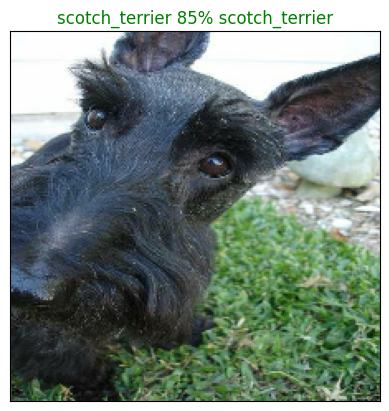

In [145]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images = val_images,
          )

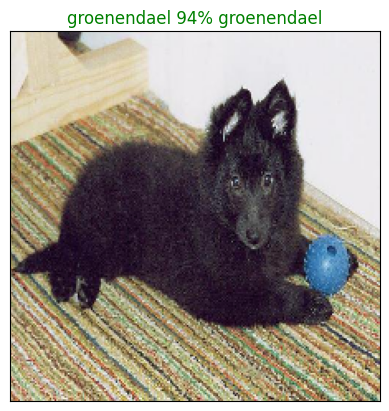

In [146]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images = val_images,
          n=77)

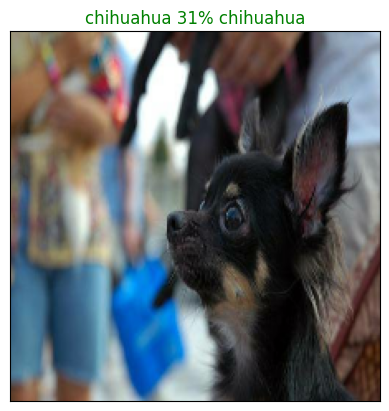

In [147]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images = val_images,
          n=49
          )

Now we have got one function to visualize our model's top prediction, let's make anoter to view our model's top 10 predictions

This function will :
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
                1. Prediction probabilities indexed_slices
                2. Prediction probabilities values
                3. Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [148]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # change the colour of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

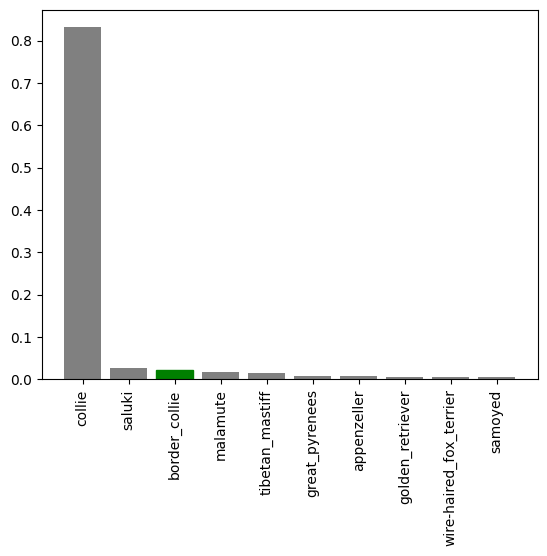

In [149]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

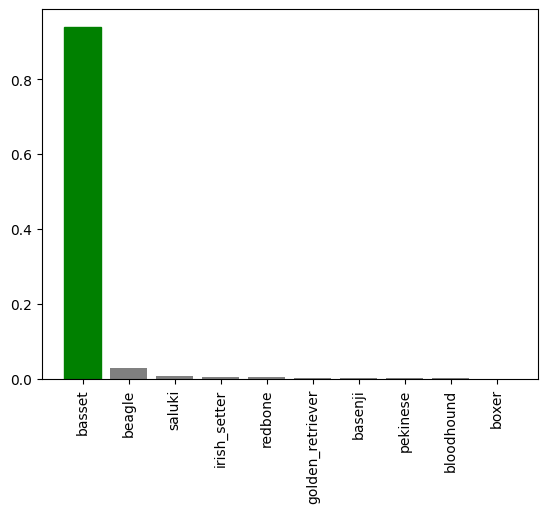

In [150]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=2)

Now we have got some functions to help us visualize our predictions and evaluate our model, let's check out a few.


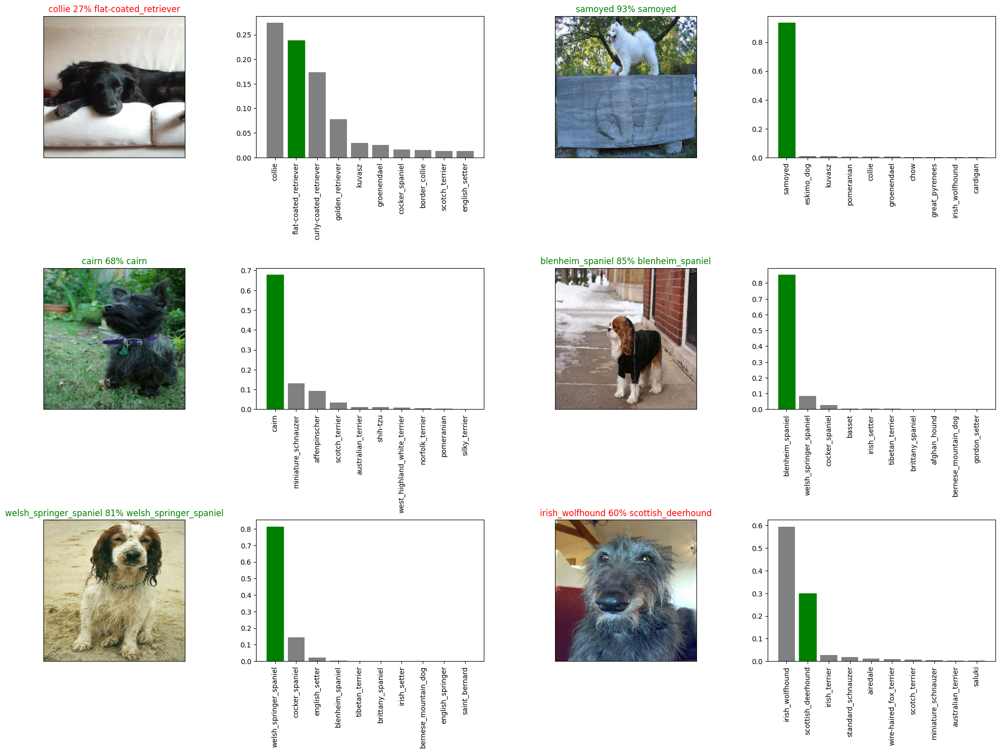

In [151]:
# Let's check out a few predictons and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [152]:
# create a function to save a model
def save_model(model,suffix=None):
  """
  saves a given model in a models directory and appends a suffix (string).
  """

  # create a model directory path name with current time
  modeldir = os.path.join("drive/MyDrive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of the model
  print(f"Saving the model to: {model_path}...")
  model.save(model_path)
  return model_path


In [153]:
# create a function to load a trained model
def load_model(model_path):
  """
  loads a saved model from a specified path.
  """
  print(f"loading savded model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have got functions to save and load a trained model, let's make sure thet work.

In [154]:
# save our model trained on 1000 images
save_model(model,suffix = "1000-images-mobilenetv2")

Saving the model to: drive/MyDrive/Dog vision/models/20240121-093024-1000-images-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog vision/models/20240121-093024-1000-images-mobilenetv2.h5'

In [155]:
# load a trained model
Loaded_1000_image_model = load_model("drive/MyDrive/Dog vision/models/20240120-194406-1000-images-mobilenetv2.h5")

loading savded model from: drive/MyDrive/Dog vision/models/20240120-194406-1000-images-mobilenetv2.h5


In [156]:
# evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 102ms/step - loss: 1.2565 - accuracy: 0.6750


[1.2565134763717651, 0.675000011920929]

In [157]:
# evaluate the loaded model
Loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 154ms/step - loss: 1.2898 - accuracy: 0.6800


[1.2898170948028564, 0.6800000071525574]

## Training a big dog model (on the full data)

In [168]:
len(X),len(y)

(10222, 10222)

In [169]:
X[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [170]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [171]:
# create a data batch with the full dataset
full_data = create_data_batches(X,y)

creating training data batches...


In [172]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [173]:
# create a model for full model
full_model = create_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [174]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


Note : Running the cell below will take a little while ( maybe upto 30mins for the first epoch) because the GPU we are using in the runtime has to load all of the images into memory.

In [175]:
# fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 145ms/step - loss: 1.3261 - accuracy: 0.6680
Epoch 2/100
320/320 [==============================] - 43s 135ms/step - loss: 0.3964 - accuracy: 0.8821
Epoch 3/100
320/320 [==============================] - 46s 143ms/step - loss: 0.2337 - accuracy: 0.9370
Epoch 4/100
320/320 [==============================] - 51s 158ms/step - loss: 0.1518 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 53s 165ms/step - loss: 0.1075 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 47s 146ms/step - loss: 0.0756 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 59s 183ms/step - loss: 0.0596 - accuracy: 0.9902
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0469 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0364 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 40s 125m

In [176]:
save_model(full_model,suffix="full-image-set-mobilenetv2")

Saving the model to: drive/MyDrive/Dog vision/models/20240121-110804-full-image-set-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog vision/models/20240121-110804-full-image-set-mobilenetv2.h5'

In [178]:
loaded_full_model = load_model("drive/MyDrive/Dog vision/models/20240121-101616-full-image-set-mobilenetv2.h5")

loading savded model from: drive/MyDrive/Dog vision/models/20240121-101616-full-image-set-mobilenetv2.h5


## Making predictions on the test data

Since our model has been trained on images in the form of tensor batches, we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on the test data, we will :
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True'(since the test data does'nt have labels).
* Make a predictions array by passing the test batches to the 'predict()' method called on our model.

In [193]:
# Load the image filenames
test_path = "/content/drive/MyDrive/Dog vision/test/"
test_filenames = [test_path+ fname for fname in os.listdir(test_path)]
test_filenames

['/content/drive/MyDrive/Dog vision/test/e21d378710d164f126e7d0b380dc7a1a.jpg',
 '/content/drive/MyDrive/Dog vision/test/e1e79b3edfb3579e46ad914bf755dbbc.jpg',
 '/content/drive/MyDrive/Dog vision/test/e079440ee0061b92ec22faf17be13908.jpg',
 '/content/drive/MyDrive/Dog vision/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 '/content/drive/MyDrive/Dog vision/test/df577444ba8b7733f42c49e9d42111a9.jpg',
 '/content/drive/MyDrive/Dog vision/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 '/content/drive/MyDrive/Dog vision/test/dd3eb4338145e614d325a917a35e5a1e.jpg',
 '/content/drive/MyDrive/Dog vision/test/e79030be9c9769f3604474aea16039bd.jpg',
 '/content/drive/MyDrive/Dog vision/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 '/content/drive/MyDrive/Dog vision/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 '/content/drive/MyDrive/Dog vision/test/e5507ebc0e05513bf543e160a484666f.jpg',
 '/content/drive/MyDrive/Dog vision/test/e8e5d64a1789dd86009b07003bed090b.jpg',
 '/content/drive/MyDrive/Dog vision/test

In [194]:
len(test_filenames)

10357

In [195]:
# create test databatch
test_data = create_data_batches(test_filenames,test_data=True)

creating test data batches...


In [196]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: calling 'predict()' on our full model and passing it the test data batch will take a long time to run

In [197]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 260s 795ms/step


In [198]:
# save predictions (numpy array) to csv file (for accessing later)
np.savetxt("drive/MyDrive/Dog vision/preds_array.csv",test_predictions,delimiter=",")

In [199]:
# Load predictions (numpy array) from
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv",delimiter=",")

In [200]:
test_predictions[:10]

array([[1.09083662e-11, 6.05052508e-10, 1.30683843e-15, ...,
        8.61914446e-12, 1.97069849e-09, 2.70094530e-10],
       [6.29197006e-09, 1.93468445e-15, 5.93394770e-06, ...,
        3.38811063e-10, 8.93335539e-08, 7.45117541e-06],
       [6.35820823e-12, 9.54527915e-11, 1.23075348e-15, ...,
        1.20876275e-17, 1.15800447e-15, 7.38948155e-15],
       ...,
       [4.62601520e-06, 2.94195180e-12, 5.18830934e-09, ...,
        1.02558639e-09, 1.21305721e-09, 4.34235137e-09],
       [1.49623195e-16, 7.49871916e-08, 1.22765792e-16, ...,
        1.68338564e-12, 7.38604058e-06, 4.52027929e-11],
       [1.79364309e-15, 9.99989748e-01, 3.82657535e-14, ...,
        5.49084432e-12, 2.97722402e-11, 2.01640028e-12]])

## Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a csv with an ID and a column for each different dog breed.

To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breeds columns.
* Export the DataFrame as a CSV to submit to Kaggle

In [201]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [202]:
# create a pandas DataFrame with empty columns
preds_df= pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [207]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [208]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e21d378710d164f126e7d0b380dc7a1a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1e79b3edfb3579e46ad914bf755dbbc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e079440ee0061b92ec22faf17be13908,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e145bbebb9ad1e740256e460899a6b67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df577444ba8b7733f42c49e9d42111a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [211]:
#  add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e21d378710d164f126e7d0b380dc7a1a,1.090837e-11,6.050525e-10,1.306838e-15,7.532496e-11,9.615401e-13,3.879351e-14,4.131837e-12,9.003960e-15,5.275814e-13,...,3.214559e-08,1.011741e-09,3.471879e-15,1.929963e-13,2.687547e-18,1.384626e-12,2.301099e-16,8.619144e-12,1.970698e-09,2.700945e-10
1,e1e79b3edfb3579e46ad914bf755dbbc,6.291970e-09,1.934684e-15,5.933948e-06,2.025592e-11,3.294802e-08,2.600006e-03,2.075850e-08,1.754474e-01,1.207452e-11,...,1.230280e-07,1.112062e-01,1.606577e-11,8.490422e-11,2.279318e-09,2.816027e-09,2.031518e-08,3.388111e-10,8.933355e-08,7.451175e-06
2,e079440ee0061b92ec22faf17be13908,6.358208e-12,9.545279e-11,1.230753e-15,8.545598e-23,2.628114e-12,1.356214e-19,2.925138e-11,6.338625e-13,5.980099e-15,...,1.034225e-10,1.863207e-12,2.511792e-18,7.267792e-14,2.235314e-13,7.534937e-15,5.310332e-09,1.208763e-17,1.158004e-15,7.389482e-15
3,e145bbebb9ad1e740256e460899a6b67,3.266441e-11,1.144950e-11,8.832824e-11,2.742303e-09,4.844022e-12,1.732461e-13,4.095960e-13,6.016848e-15,1.920264e-10,...,2.978751e-10,1.824578e-12,2.927373e-06,2.746426e-10,9.950474e-09,1.436948e-10,5.876546e-12,9.045156e-10,6.382631e-12,1.475172e-09
4,df577444ba8b7733f42c49e9d42111a9,2.462109e-08,4.981745e-15,8.647742e-14,2.173349e-14,5.530611e-13,2.162981e-14,2.757220e-09,5.697862e-13,3.779892e-15,...,3.269943e-12,6.636872e-13,1.796951e-14,1.881470e-13,1.074452e-15,4.644049e-14,7.007804e-14,8.624445e-15,3.739332e-12,1.781483e-12


In [213]:
# save our predictions dataframess to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images we'll :
* Get the filepaths of our own images.
* Turn the filepaths into databatches using 'create_data_batches()' and since our custom images won't have labels, we set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's 'predict()' method.
* Convert the prediction output probabilities to predicted labels.
* Compare the predicted labels to the custom images.


In [215]:
# Get the image filepaths
custom_path = "drive/MyDrive/Dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [216]:
custom_image_paths

['drive/MyDrive/Dog vision/my-dog-photos/WhatsApp Image 2024-01-21 at 17.24.27_afdb73df.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/WhatsApp Image 2024-01-21 at 17.24.23_2364be96.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/WhatsApp Image 2024-01-21 at 17.24.36_857bebeb.jpg']

In [217]:
# turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [218]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [219]:
custom_preds

array([[2.48813244e-11, 1.09117870e-07, 3.37492950e-11, 9.81662737e-11,
        6.86012358e-10, 8.12204470e-12, 1.20448995e-09, 7.92632106e-12,
        7.05224984e-12, 8.69714994e-11, 1.89780223e-11, 1.88822256e-08,
        6.76802277e-12, 1.68601719e-06, 2.29144959e-07, 4.69404940e-12,
        8.91438572e-12, 5.15450009e-12, 1.81169619e-12, 9.17754872e-10,
        6.02413789e-13, 1.18498896e-12, 1.28242239e-09, 7.86395560e-10,
        8.35126990e-09, 9.41405105e-08, 2.01074557e-09, 2.26005614e-09,
        3.08538819e-11, 2.73700493e-06, 1.73932300e-08, 1.27785233e-06,
        1.42403704e-03, 1.50406356e-06, 3.36278152e-13, 8.47104109e-10,
        3.45370304e-12, 2.21330202e-12, 3.02696410e-11, 5.57959829e-08,
        1.36655718e-08, 1.66872887e-05, 2.48335935e-10, 5.68808577e-11,
        2.05366790e-09, 8.88730423e-09, 3.51413537e-10, 1.16196963e-08,
        9.47781090e-12, 1.76213155e-06, 1.03759747e-04, 8.33162098e-13,
        3.18125756e-12, 4.84342011e-10, 1.76212872e-13, 1.262210

In [220]:
custom_preds.shape

(3, 120)

In [221]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['sussex_spaniel', 'malamute', 'sussex_spaniel']

In [222]:
# get custom images (our unbatchify() function won't work since there are'nt any labels, maybe we could fix it later)
custom_images= []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

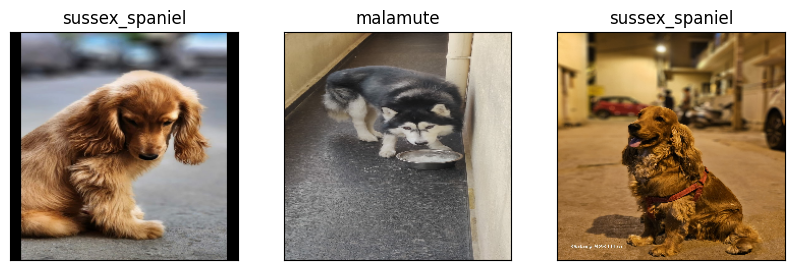

In [223]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)